In [32]:
import cv2
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

In [33]:
img = cv2.imread('unnamed.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)


In [34]:
img.shape
left=img[:,:3024,:]

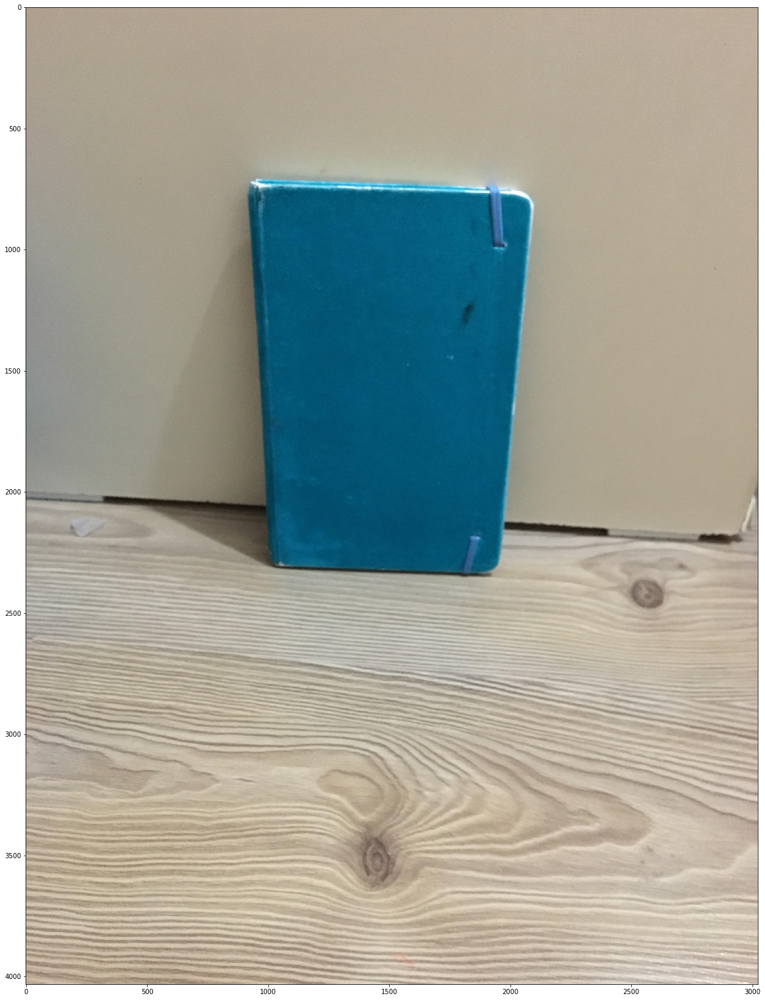

In [35]:
plt.figure(figsize=(20,44))
plt.imshow(img)
plt.show()

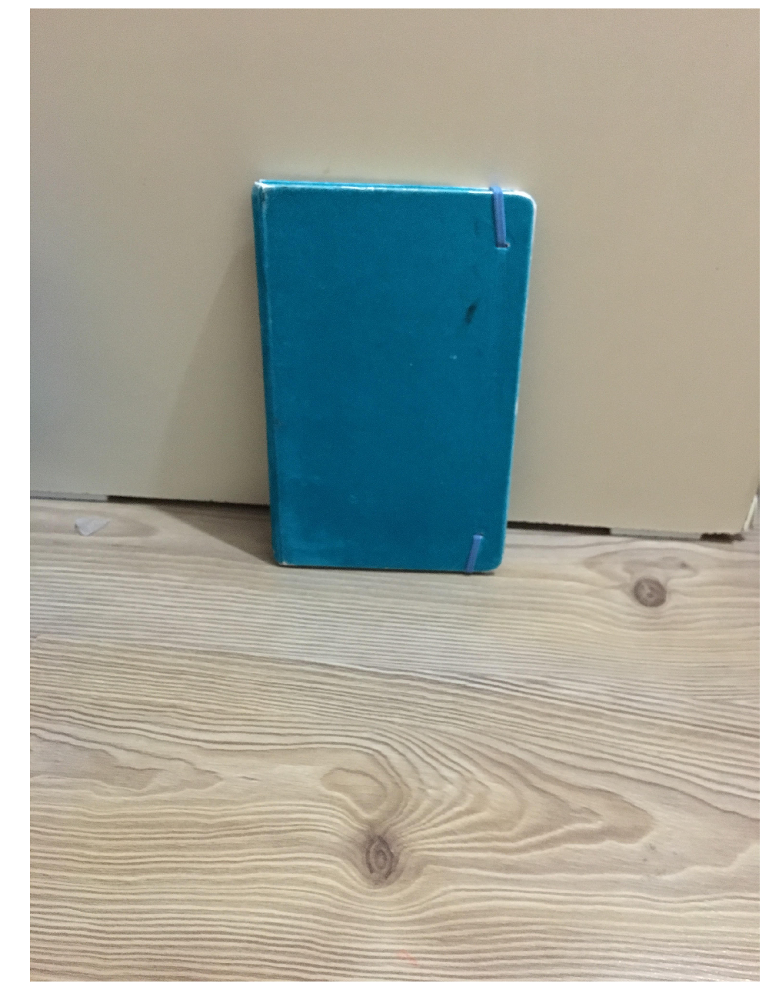

In [36]:
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(img)
plt.show()

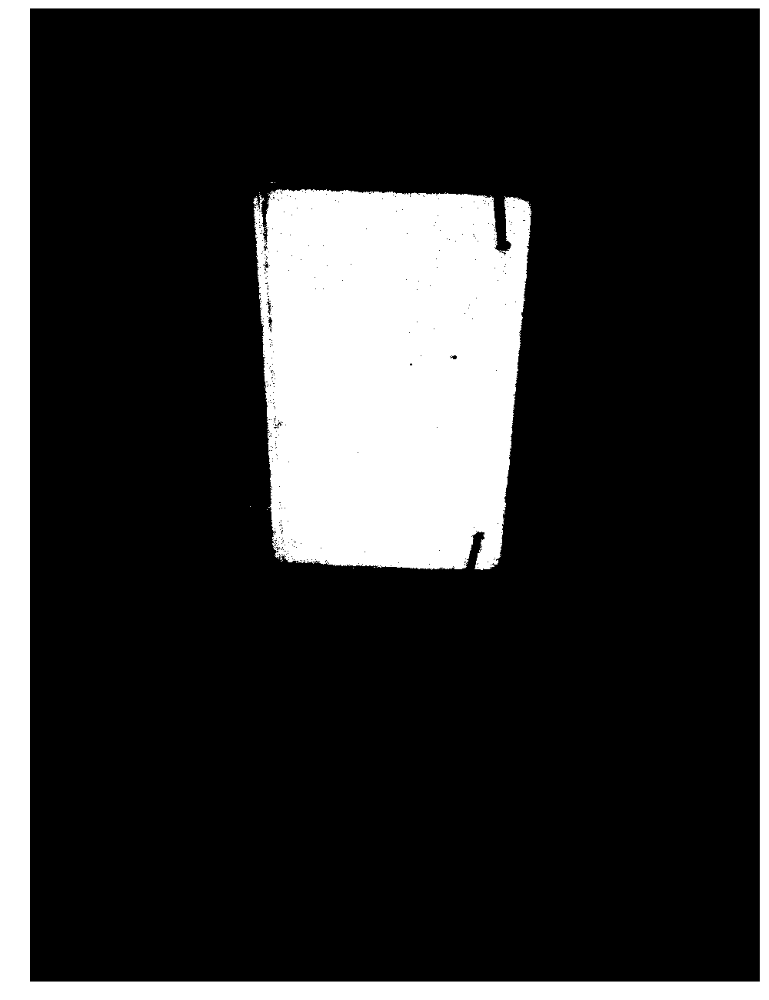

In [37]:
rgb_lower_filter = (0,0,0)
rgb_upper_filter = (15,255,255)
mask = cv2.inRange(img, rgb_lower_filter, rgb_upper_filter)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(mask,cmap='gray')
plt.show()

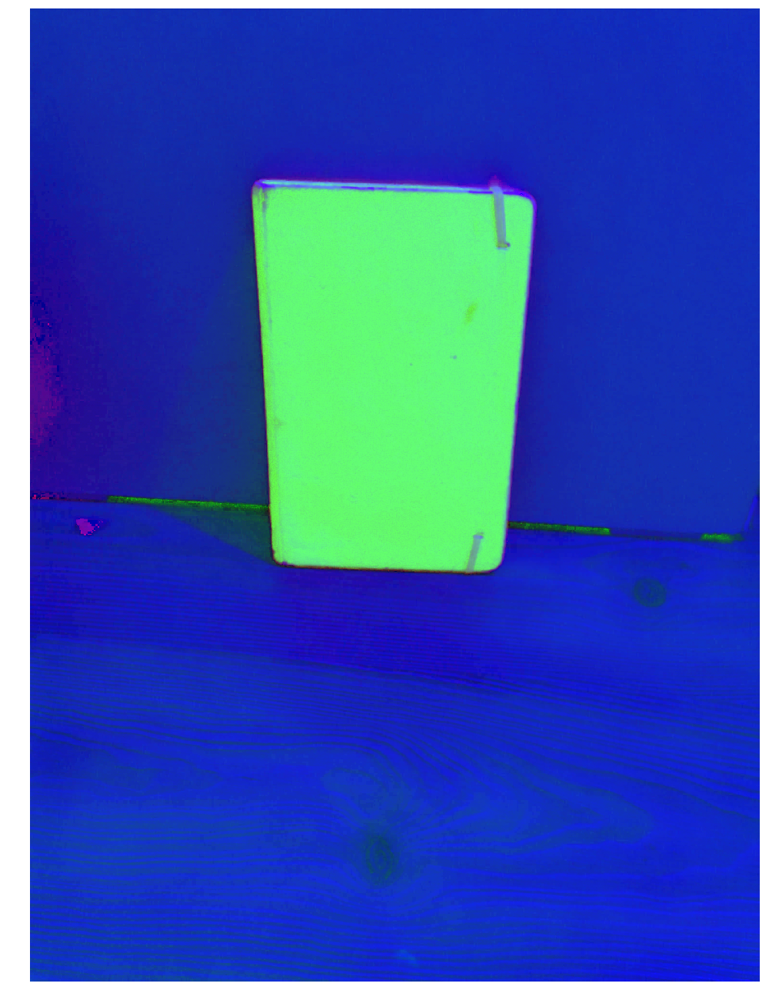

In [38]:
hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(hsv)
plt.show()

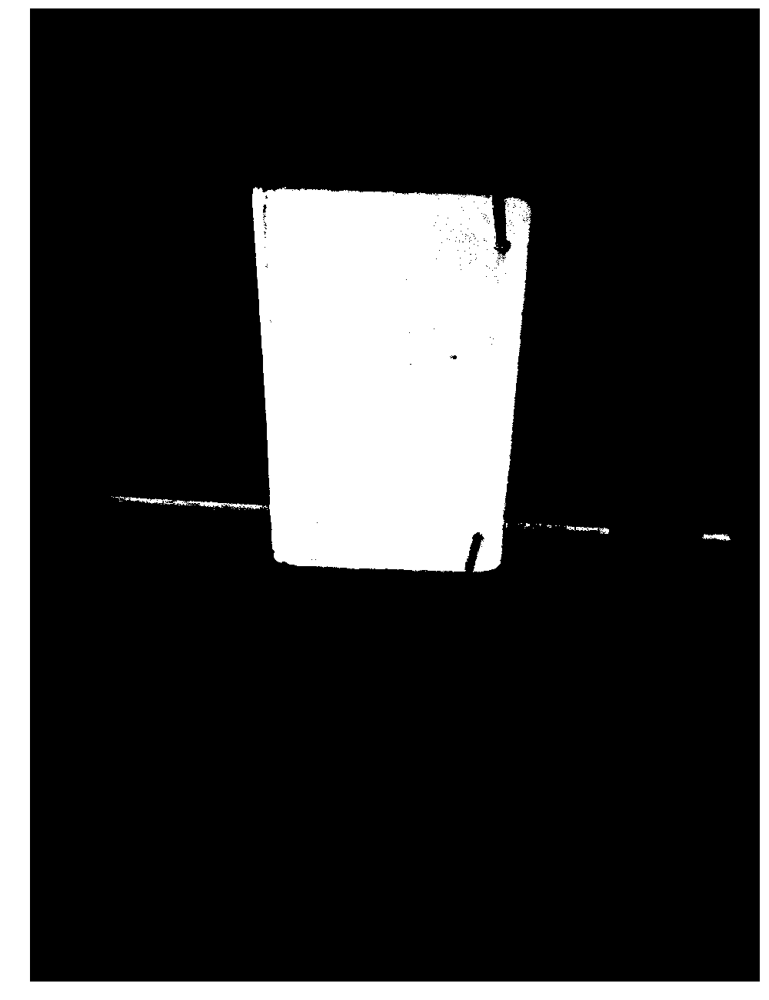

In [39]:
hsv_lower_filter = (0, 100, 0)
hsv_upper_filter = (100, 255, 141)
mask = cv2.inRange(hsv, hsv_lower_filter, hsv_upper_filter)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(mask,cmap='gray')
plt.show()

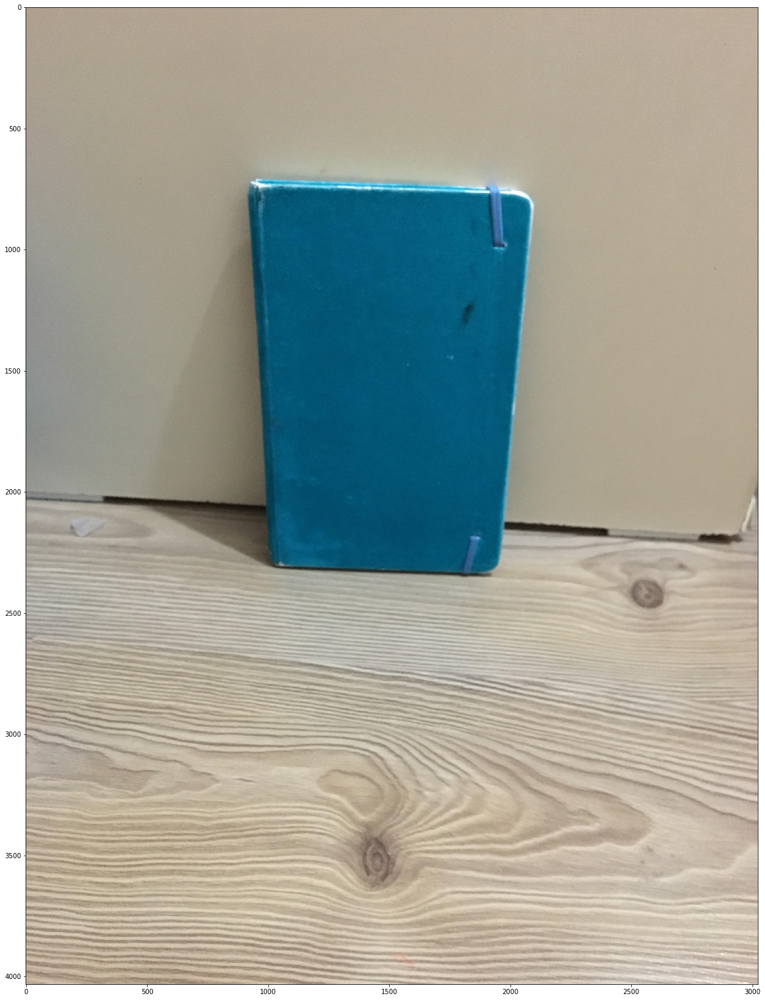

In [40]:
img = cv2.imread('unnamed.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img.shape
left=img[:,:3024,:]
plt.figure(figsize=(20,44))
plt.imshow(img)
plt.show()

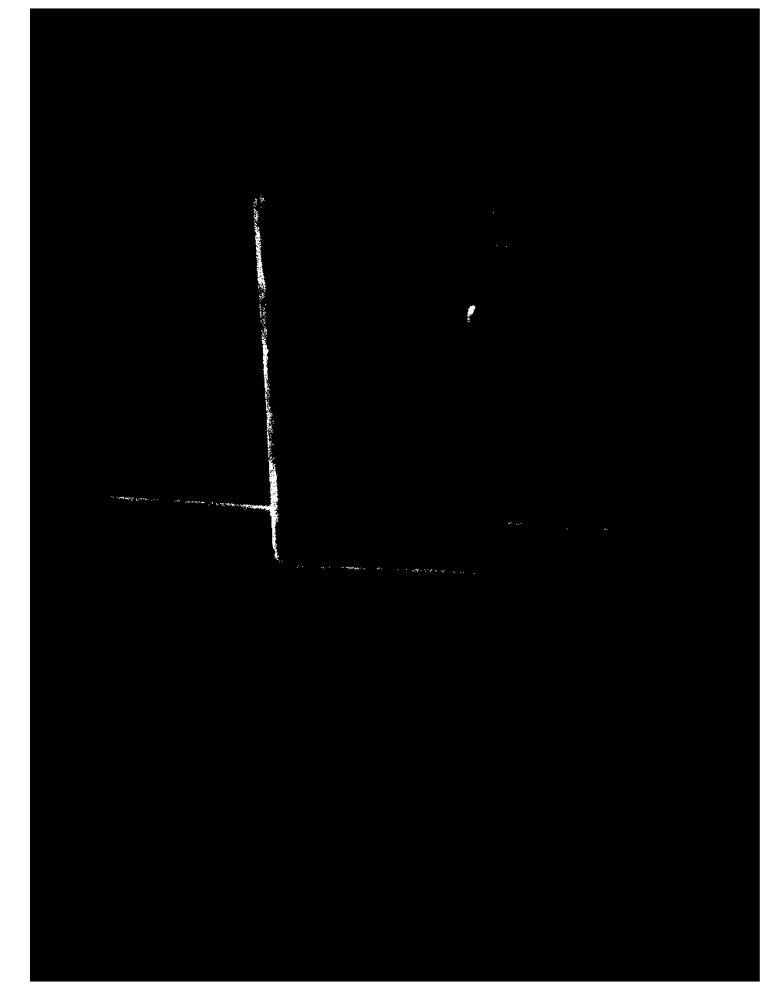

In [41]:
rgb_lower_filter = (0,0,0)
rgb_upper_filter = (25,90,85)
mask = cv2.inRange(img, rgb_lower_filter, rgb_upper_filter)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(mask,cmap='gray')
plt.show()

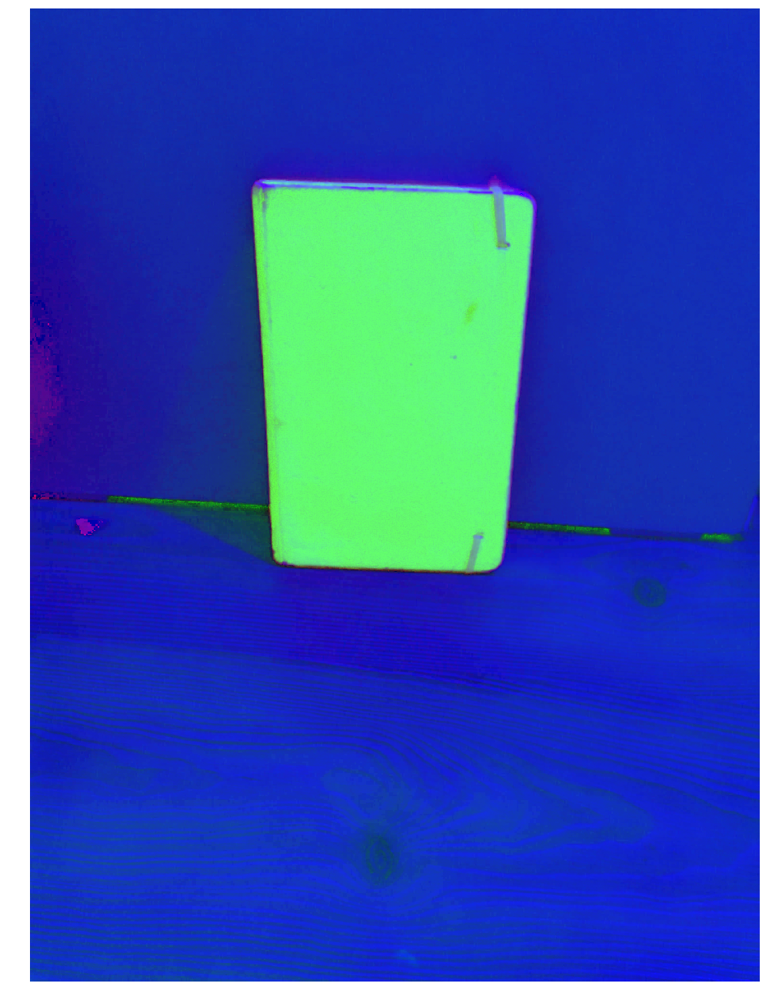

In [42]:
hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(hsv)
plt.show()

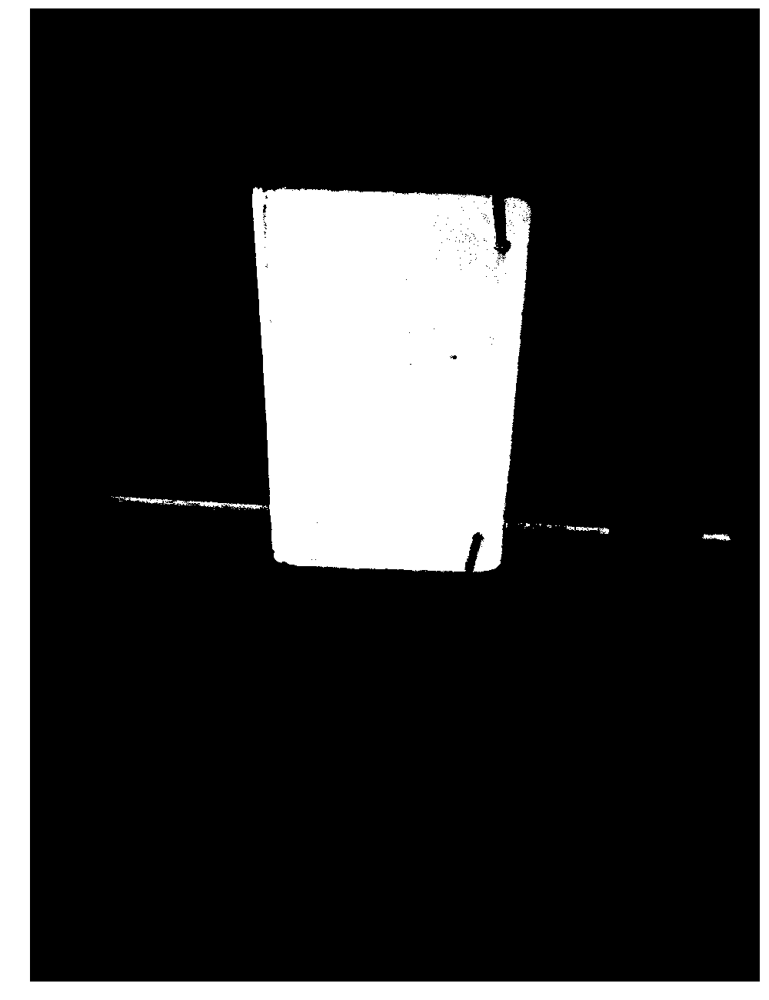

In [43]:
mask = cv2.inRange(hsv, hsv_lower_filter, hsv_upper_filter)
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(mask,cmap='gray')
plt.show()

In [44]:
mask.shape

(4032, 3024)

In [45]:
img,contours,hi= cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

In [46]:
len(contours)

228

In [47]:
center_list = []
radius_list = []
for cnt in contours:
    (x,y),radius = cv2.minEnclosingCircle(cnt)
    center_list.append((int(x),int(y)))
    radius_list.append(int(radius))
ix = np.argmax(radius_list)

In [48]:
print 'Nesne Konumu : ',center_list[ix]
print 'Nesne Büyüklüğü : ',radius_list[ix]

Nesne Konumu :  (1454, 1514)
Nesne Büyüklüğü :  934


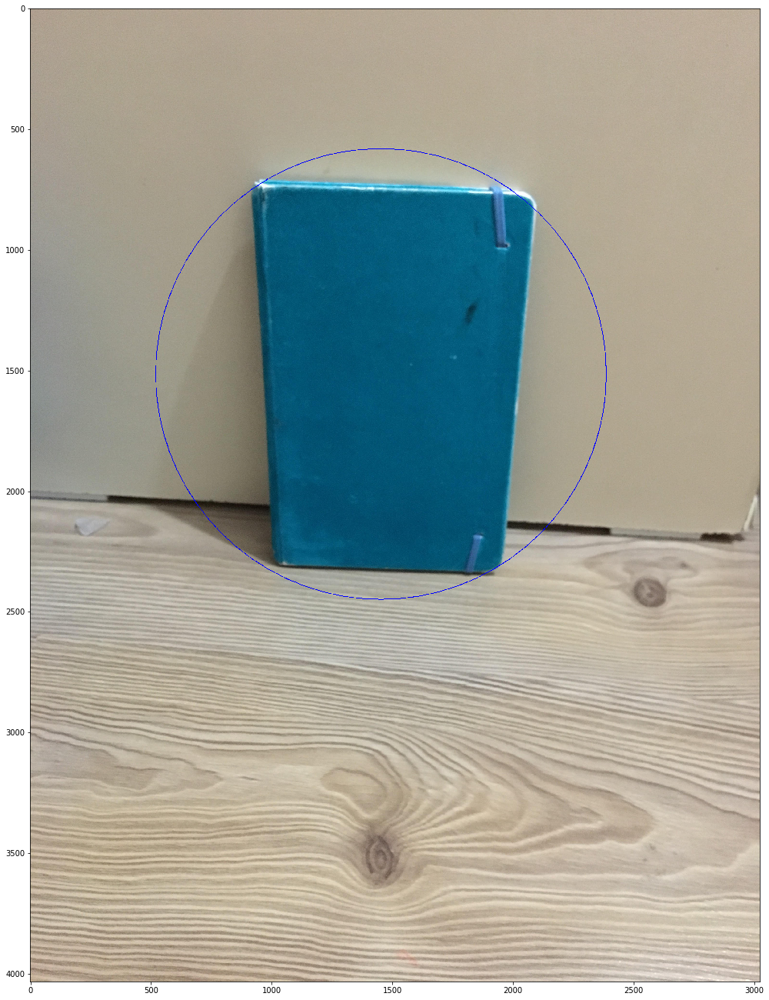

In [49]:
out_image = left.copy()
cv2.circle(out_image,center_list[ix],radius_list[ix],(0,0,255),2)
plt.figure(figsize=(17,30))
#plt.axis("off")
plt.imshow(out_image)
plt.show()

In [50]:
x,y,w,h = cv2.boundingRect(contours[ix])
out_image = left.copy()
cv2.rectangle(out_image,(x,y),(x+w,y+h),(0,255,255),2)
print 'Kapsayan Dikdörtgen sol üst : ',(x,y)
print 'Kapsayan Dikdörtgen En / Boy : ',(w,h)

Kapsayan Dikdörtgen sol üst :  (920, 740)
Kapsayan Dikdörtgen En / Boy :  (1155, 1596)


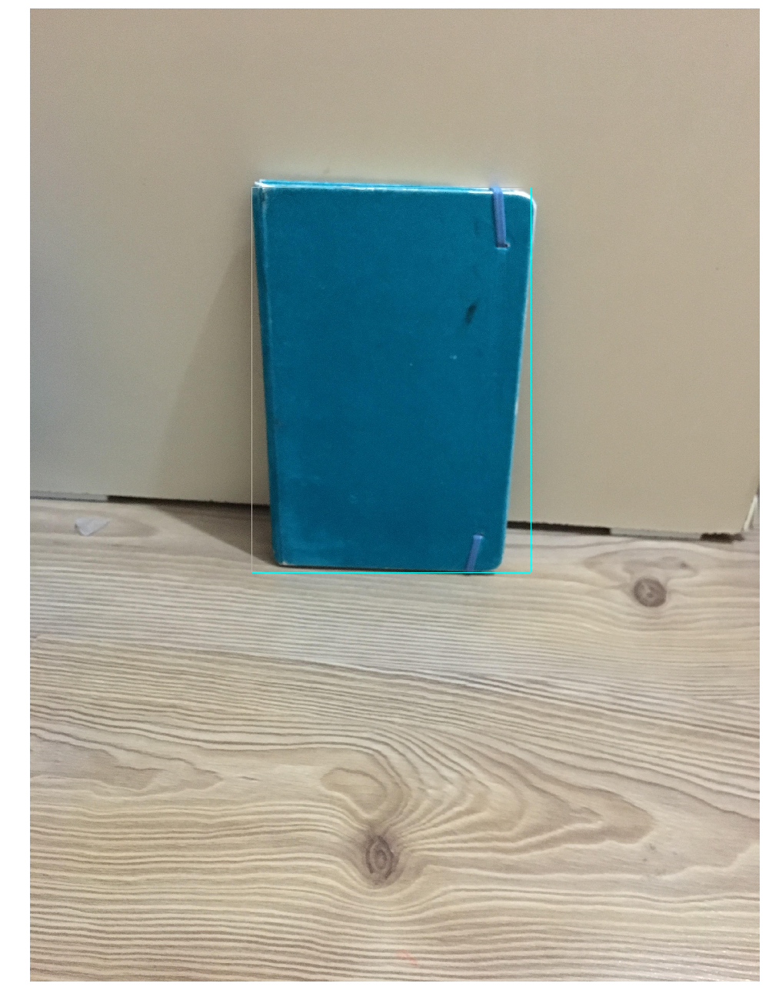

In [51]:
plt.figure(figsize=(17,30))
plt.axis("off")
plt.imshow(out_image)
plt.show()